# Using Hamiltonian Mechanics to Simulate Physical Systems

## Introduction

## Theory

$$
  H(q, p, t)
$$ (hamil_eq)

## 2-Body System

In [1]:
from src import Engine
import plotly.graph_objects as go

In [2]:
def two_body_hamiltonian(q, p, t, m, G):
    T = (p[0]**2).sum() / (2 * m[0]) + (p[1]**2).sum() / (2 * m[1])
    U = -1 * G * m[0] * m[1] / (q[0] - q[1]).norm()
    return T + U

In [3]:
q0 = [[-1.0, 0.0], [1.0, 0.0]]
p0 = [[0.0, -1.0], [0.0, 1.0]]
m = [5.0, 1.0]
G = 1
step_size = 0.001
num_steps = 10000

In [4]:
engine = Engine(q0=q0, p0=p0, step_size=step_size, m=m, G=G, mode='conserve')

In [5]:
engine.enable_history(num_steps)

In [6]:
for _ in range(num_steps):
    engine.zero_grad()
    hamiltonian = two_body_hamiltonian(*engine.state, **engine.params)
    hamiltonian.backward()
    engine.step()

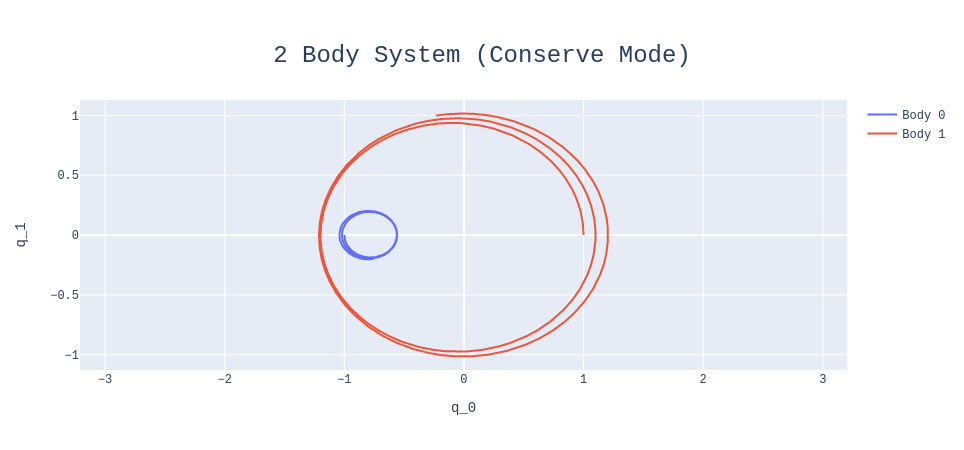

In [7]:
title = dict(text='2 Body System (Conserve Mode)', font=dict(size=24),
             x=0.5, y=0.9, xanchor='center', yanchor='top')
layout = go.Layout(title=title, xaxis_title='q_0', yaxis_title='q_1',
                   font=dict(family='Courier New, monospace', size=12),
                   yaxis=dict(scaleanchor='x', scaleratio=1))
traces = [go.Scatter(x=engine.history[:, 0, body, 0].numpy(),
                     y=engine.history[:, 0, body, 1].numpy(),
                     name='Body ' + str(body))
          for body in range(engine.history[:][0].shape[1])]
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [8]:
engine = Engine(q0=q0, p0=p0, step_size=step_size, drag=0.05, m=m, G=G, mode='dissipate')

In [9]:
engine.enable_history(num_steps)

In [10]:
for _ in range(num_steps):
    engine.zero_grad()
    hamiltonian = engine.evaluate(two_body_hamiltonian)
    hamiltonian.backward()
    engine.step()

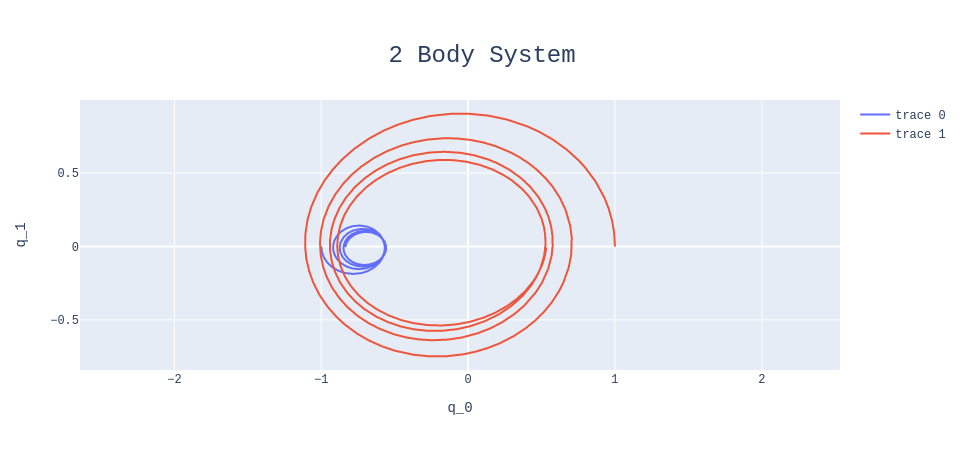

In [11]:
title = dict(text='2 Body System', font=dict(size=24),
             x=0.5, y=0.9, xanchor='center', yanchor='top')
layout = go.Layout(title=title, xaxis_title='q_0', yaxis_title='q_1',
                   font=dict(family='Courier New, monospace', size=12),
                   yaxis=dict(scaleanchor='x', scaleratio=1))
traces = [go.Scatter(x=engine.history[:, 0, body, 0].numpy(),
                     y=engine.history[:, 0, body, 1].numpy())
          for body in range(engine.history[:][0].shape[1])]
fig = go.Figure(data=traces, layout=layout)
fig.show()

In [12]:
engine = Engine(q0=q0, p0=p0, step_size=step_size, target=0, m=m, G=G, mode='target')

In [13]:
H0 = engine.evaluate(two_body_hamiltonian).detach()

In [14]:
engine.target = H0

In [15]:
H0

tensor(-1.9000)

In [16]:
engine.enable_history(num_steps, H0)

In [17]:
for _ in range(num_steps):
    def closure():
        engine.zero_grad()
        hamiltonian = engine.evaluate(two_body_hamiltonian)
        hamiltonian.backward()
        return hamiltonian
    engine.step(closure)

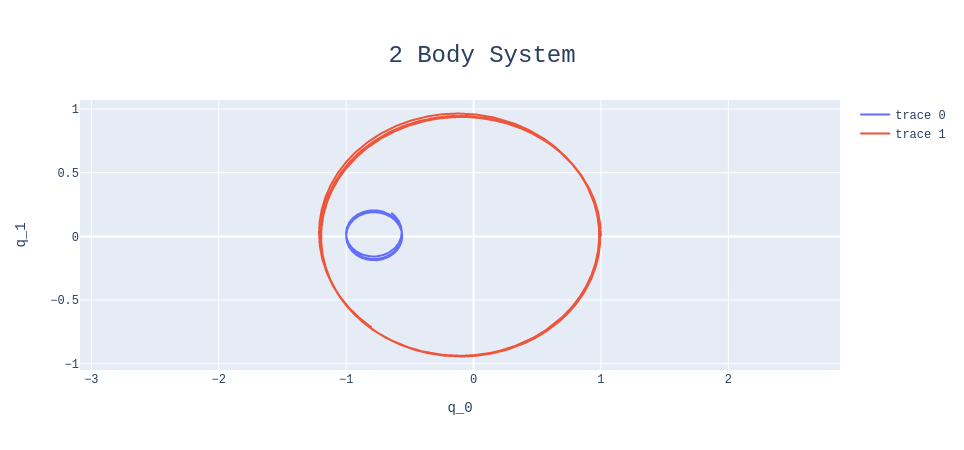

In [18]:
title = dict(text='2 Body System', font=dict(size=24),
             x=0.5, y=0.9, xanchor='center', yanchor='top')
layout = go.Layout(title=title, xaxis_title='q_0', yaxis_title='q_1',
                   font=dict(family='Courier New, monospace', size=12),
                   yaxis=dict(scaleanchor='x', scaleratio=1))
traces = [go.Scatter(x=engine.history[:, 0, body, 0].numpy(),
                     y=engine.history[:, 0, body, 1].numpy())
          for body in range(engine.history[:][0].shape[1])]
fig = go.Figure(data=traces, layout=layout)
fig.show()

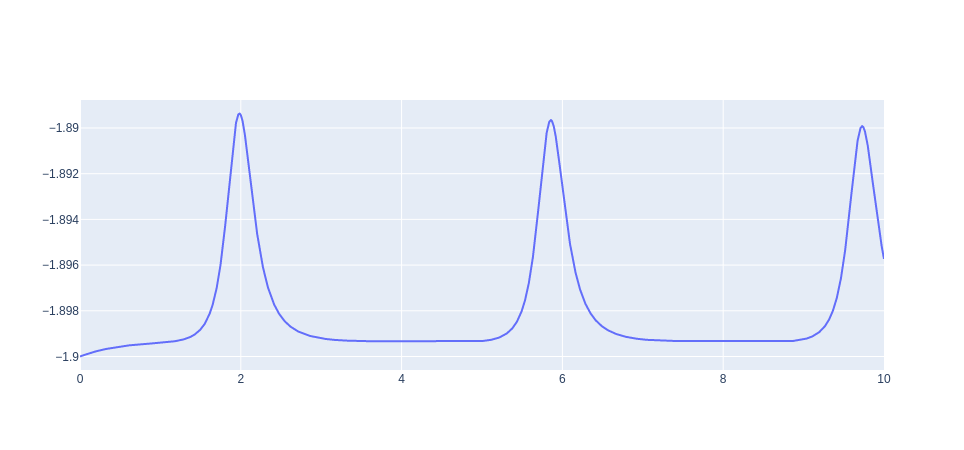

In [19]:
fig = go.Figure(data=[go.Scatter(x=engine.history[:, 2], y=engine.history[:, 3])])
fig.show()